### Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
import math

%matplotlib inline

In [2]:
# pip install ydata-profiling
from ydata_profiling import ProfileReport

### Read data

In [3]:
data = pd.read_csv("AIDS_Classification.csv", thousands=',', skipinitialspace=True)
#data = pd.read_csv("churn-bigml-80.csv", thousands=',', skipinitialspace=True)
data

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
0,948,2,48,89.8128,0,0,0,100,0,0,...,0,1,0,1,0,422,477,566,324,0
1,1002,3,61,49.4424,0,0,0,90,0,1,...,1,3,0,1,0,162,218,392,564,1
2,961,3,45,88.4520,0,1,1,90,0,1,...,1,3,0,1,1,326,274,2063,1893,0
3,1166,3,47,85.2768,0,1,0,100,0,1,...,1,3,0,1,0,287,394,1590,966,0
4,1090,0,43,66.6792,0,1,0,100,0,1,...,1,3,0,0,0,504,353,870,782,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134,1091,3,21,53.2980,1,0,0,100,0,1,...,1,3,0,1,1,152,109,561,720,0
2135,395,0,17,102.9672,1,0,0,100,0,1,...,1,3,0,0,1,373,218,1759,1030,0
2136,1104,2,53,69.8544,1,1,0,90,0,1,...,1,3,0,1,0,419,364,1391,1041,0
2137,465,0,14,60.0000,1,0,0,100,0,0,...,0,1,0,0,0,166,169,999,1838,1


### Drop empty lines in data and remove NAN's (in my case I don't have any)

In [4]:
data = data.dropna()
data

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
0,948,2,48,89.8128,0,0,0,100,0,0,...,0,1,0,1,0,422,477,566,324,0
1,1002,3,61,49.4424,0,0,0,90,0,1,...,1,3,0,1,0,162,218,392,564,1
2,961,3,45,88.4520,0,1,1,90,0,1,...,1,3,0,1,1,326,274,2063,1893,0
3,1166,3,47,85.2768,0,1,0,100,0,1,...,1,3,0,1,0,287,394,1590,966,0
4,1090,0,43,66.6792,0,1,0,100,0,1,...,1,3,0,0,0,504,353,870,782,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134,1091,3,21,53.2980,1,0,0,100,0,1,...,1,3,0,1,1,152,109,561,720,0
2135,395,0,17,102.9672,1,0,0,100,0,1,...,1,3,0,0,1,373,218,1759,1030,0
2136,1104,2,53,69.8544,1,1,0,90,0,1,...,1,3,0,1,0,419,364,1391,1041,0
2137,465,0,14,60.0000,1,0,0,100,0,0,...,0,1,0,0,0,166,169,999,1838,1


### Reset the index for potentially removed rows in data

In [5]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [6]:
data.describe()

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
count,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,...,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000,2139.000000
mean,879.098177,1.520804,35.248247,75.125311,0.084151,0.661057,0.131370,95.446470,0.021973,0.550257,...,0.585788,1.979897,0.172978,0.751286,0.362786,350.501169,371.307153,986.627396,935.369799,0.243572
std,292.274324,1.127890,8.709026,13.263164,0.277680,0.473461,0.337883,5.900985,0.146629,0.497584,...,0.492701,0.899053,0.378317,0.432369,0.480916,118.573863,144.634909,480.197750,444.976051,0.429338
min,14.000000,0.000000,12.000000,31.000000,0.000000,0.000000,0.000000,70.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,49.000000,40.000000,124.000000,0.000000
25%,727.000000,1.000000,29.000000,66.679200,0.000000,0.000000,0.000000,90.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,1.000000,0.000000,263.500000,269.000000,654.000000,631.500000,0.000000
50%,997.000000,2.000000,34.000000,74.390400,0.000000,1.000000,0.000000,100.000000,0.000000,1.000000,...,1.000000,2.000000,0.000000,1.000000,0.000000,340.000000,353.000000,893.000000,865.000000,0.000000
75%,1091.000000,3.000000,40.000000,82.555200,0.000000,1.000000,0.000000,100.000000,0.000000,1.000000,...,1.000000,3.000000,0.000000,1.000000,1.000000,423.000000,460.000000,1207.000000,1146.500000,0.000000
max,1231.000000,3.000000,70.000000,159.939360,1.000000,1.000000,1.000000,100.000000,1.000000,1.000000,...,1.000000,3.000000,1.000000,1.000000,1.000000,1199.000000,1119.000000,5011.000000,6035.000000,1.000000


### View data statistics - long format

### Column name explanations

##### time: time to failure or censoring
##### trt: treatment indicator (0 = ZDV only; 1 = ZDV + ddI, 2 = ZDV + Zal, 3 = ddI only)
##### age: age (yrs) at baseline
##### wtkg: weight (kg) at baseline
##### hemo: hemophilia (0=no, 1=yes)
##### homo: homosexual activity (0=no, 1=yes)
##### drugs: history of IV drug use (0=no, 1=yes)
##### karnof: Karnofsky score (on a scale of 0-100)
##### oprior: Non-ZDV antiretroviral therapy pre-175 (0=no, 1=yes)
##### z30: ZDV in the 30 days prior to 175 (0=no, 1=yes)
##### preanti: days pre-175 anti-retroviral therapy
##### race: race (0=White, 1=non-white)
##### gender: gender (0=F, 1=M)
##### str2: antiretroviral history (0=naive, 1=experienced)
##### strat: antiretroviral history stratification (1='Antiretroviral Naive',2='> 1 but <= 52 weeks of prior antiretroviral therapy',3='> 52 weeks)
##### symptom: symptomatic indicator (0=asymp, 1=symp)
##### treat: treatment indicator (0=ZDV only, 1=others)
##### offtrt: indicator of off-trt before 96+/-5 weeks (0=no,1=yes)
##### cd40: CD4 at baseline
##### cd420: CD4 at 20+/-5 weeks
##### cd80: CD8 at baseline
##### cd820: CD8 at 20+/-5 weeks
##### infected: is infected with AIDS (0=No, 1=Yes)

In [7]:
profile = ProfileReport(data, title="AIDS classification")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Important: We have 75.6% samples with NOT INFECTED and 24.4% INFECTED samples in our dataset

### Change categorical string/boolean columns to categorical integer columns (in my case there is no categorical value)

### Create x and y from original data

In [9]:
x_data = data.drop(columns=['infected'])
x_data

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,gender,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820
0,948,2,48,89.8128,0,0,0,100,0,0,...,0,0,1,0,1,0,422,477,566,324
1,1002,3,61,49.4424,0,0,0,90,0,1,...,0,1,3,0,1,0,162,218,392,564
2,961,3,45,88.4520,0,1,1,90,0,1,...,1,1,3,0,1,1,326,274,2063,1893
3,1166,3,47,85.2768,0,1,0,100,0,1,...,1,1,3,0,1,0,287,394,1590,966
4,1090,0,43,66.6792,0,1,0,100,0,1,...,1,1,3,0,0,0,504,353,870,782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134,1091,3,21,53.2980,1,0,0,100,0,1,...,1,1,3,0,1,1,152,109,561,720
2135,395,0,17,102.9672,1,0,0,100,0,1,...,1,1,3,0,0,1,373,218,1759,1030
2136,1104,2,53,69.8544,1,1,0,90,0,1,...,1,1,3,0,1,0,419,364,1391,1041
2137,465,0,14,60.0000,1,0,0,100,0,0,...,1,0,1,0,0,0,166,169,999,1838


In [10]:
y_data = data[['infected']]
y_data

,infected
0,0
1,1
2,0
3,0
4,0
...,...
2134,0
2135,0
2136,0
2137,1


### View features against Infected

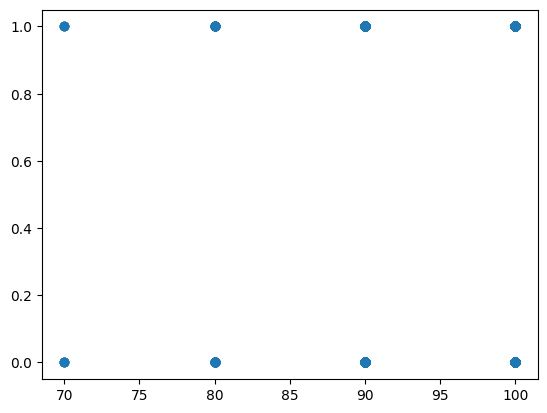

In [11]:
plt.scatter(x_data['karnof'], y_data)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [12]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [13]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [14]:
x_train[0]

array([948.    ,   2.    ,  48.    ,  89.8128,   0.    ,   0.    ,
         0.    , 100.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   1.    ,   0.    ,   1.    ,   0.    ,
       422.    , 477.    , 566.    , 324.    ])

### Visualize the number of training samples and number of validation samples

In [15]:
len(y_train), len(y_validation)

(1711, 428)

### Visualize the number of NOT INFECTED vs INFECTED samples in training dataset

#### Having 75.6% samples with NOT INFECTED and 24.4% samples with INFECTED in our dataset
#### So we have a ratio of 3 NOT INFECTED samples to 1 INFECTED sample
#### Our training and validation dataset should respect this ratio approximately

In [16]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int64), array([1301,  410], dtype=int64))

#### 1301 samples of 0 (NOT INFECTED) and 410 samples of 1 (INFECTED)
#### 410 * 3 = 1230

### Visualize the number of NOT INFECTED vs INFECTED samples in validation dataset

#### 317 samples of 0 (NOT INFECTED) and 111 samples of 1 (INFECTED)
#### 111 * 3 = 333

In [17]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int64), array([317, 111], dtype=int64))

### Standardization - mean and standard deviation calculation

In [18]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [19]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [20]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [21]:
x_train.min(), x_train.max()

(-4.224204559108399, 11.254647528261913)

### View min and max values after standardization from training dataset

In [22]:
x_validation.min(), x_validation.max()

(-2.8378071332517196, 7.023071223600448)

### Logistic Regression implementation

In [23]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

#### Examples of using sigmoid values

In [24]:
sigmoid(1)

0.7310585786300049

In [25]:
sigmoid(0)

0.5

In [26]:
sigmoid(-1)

0.2689414213699951

In [27]:
sigmoid(-1000)

C:\Users\User\AppData\Local\Temp\ipykernel_9084\3992194360.py:2: RuntimeWarning: overflow encountered in exp
  g = 1 / (1 + np.exp(-x))


0.0

In [28]:
sigmoid(100)

1.0

In [29]:
def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i) 
             
    cost = cost / m
    return cost

In [30]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += err_i * X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar
        
    return dj_db, dj_dw

In [31]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [32]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\User\AppData\Local\Temp\ipykernel_9084\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.432672 	  Cost Validation: 0.414762
Iteration  100: Cost Train: 0.322796 	  Cost Validation: 0.349286
Iteration  200: Cost Train: 0.322788 	  Cost Validation: 0.349143
Iteration  300: Cost Train: 0.322787 	  Cost Validation: 0.349119
Iteration  400: Cost Train: 0.322787 	  Cost Validation: 0.349113
Iteration  500: Cost Train: 0.322787 	  Cost Validation: 0.349111
Iteration  600: Cost Train: 0.322787 	  Cost Validation: 0.349111
Iteration  700: Cost Train: 0.322787 	  Cost Validation: 0.349111
Iteration  800: Cost Train: 0.322787 	  Cost Validation: 0.349110
Iteration  900: Cost Train: 0.322787 	  Cost Validation: 0.349110
Iteration  999: Cost Train: 0.322787 	  Cost Validation: 0.349110


##### Here we can observe that we have a high learning rate(alpha = 3) so we reach to the minimum at about 300th iteration and can't minimize any more. Loss can't be reduced any further than 0.322787 in train and 0.349110 in validation  

In [33]:
best_w_final = np.load('model/best_valid_w_in.npy')
best_b_final = np.load('model/best_valid_b.npy')

#### Looking at the graph and the performance metrics below(accuracy, precision, f1 score, etc), we can say that our model managed to predict most of the examples correctly in train as well as in validation dataset. In order to get a more precise and correct results we'll use Polynomial Transformation for the features (meaning creating new features by raising existing features to various powers so that our model can capture non-linear patterns(if exist) in our dataset)

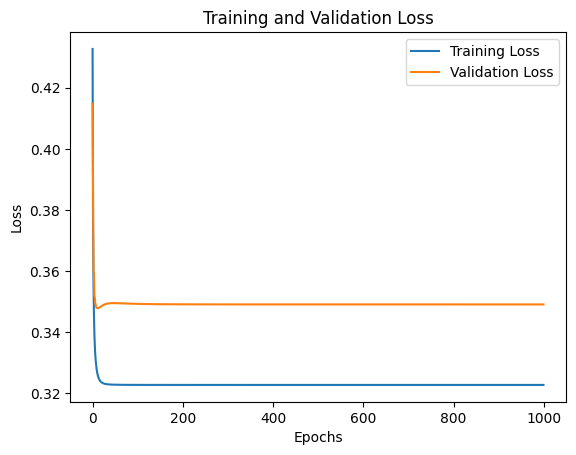

In [34]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

In [35]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [36]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\User\AppData\Local\Temp\ipykernel_9084\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [37]:
y_train.shape

(1711, 1)

In [38]:
y_train.reshape(-1).shape, y_predicted.shape

((1711,), (1711,))

In [39]:
(y_train.reshape(-1) == y_predicted).sum()

1495

In [40]:
x_train.shape
x_train.shape

(1711, 22)

In [41]:
y_train = y_train.reshape(-1)

In [42]:
type(y_predicted)

numpy.ndarray

In [43]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()
    
    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)
    
    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [44]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [45]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 87.38% 
 Precision: 79.75% 
 Recall: 63.41% 
 F1 Score: 70.65% 
 Specificity: 94.93% 
 False Positive Rate: 5.07% 
 False Negative Rate: 36.59%


In [46]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\User\AppData\Local\Temp\ipykernel_9084\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [47]:
y_validation = y_validation.reshape(-1)

In [48]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
1 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 1.0
0 0.0
1 1.0
1 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
1 1.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 1.0
0 0.0
1 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
1 0.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.

In [49]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [50]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 85.05% 
 Precision: 77.65% 
 Recall: 59.46% 
 F1 Score: 67.35% 
 Specificity: 94.01% 
 False Positive Rate: 5.99% 
 False Negative Rate: 40.54%


### Analyze the feature importance

<Axes: ylabel='Feature'>

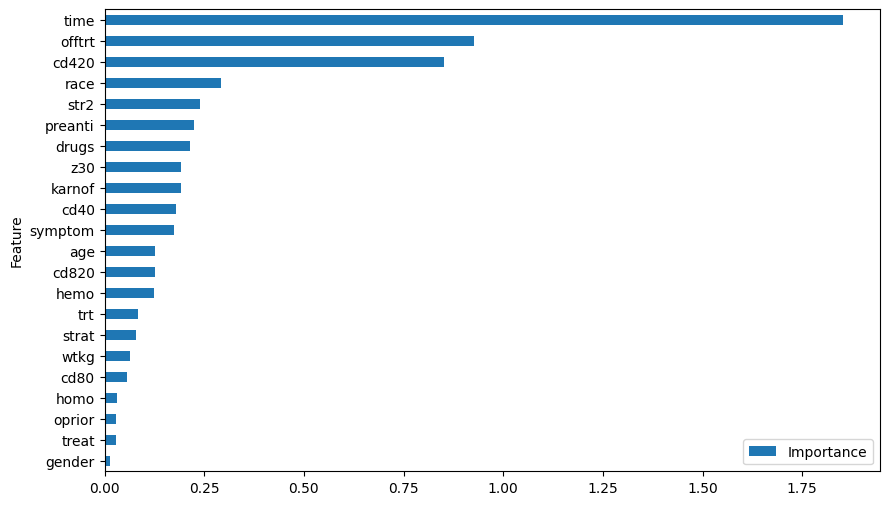

In [51]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

### Add polynomial features for improving model capacity

In [54]:
#pip install scikit-learn
from sklearn import preprocessing

In [55]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [56]:
poly_values = poly.fit_transform(x_data)
poly_values

array([[9.480000e+02, 2.000000e+00, 4.800000e+01, ..., 3.203560e+05,
        1.833840e+05, 1.049760e+05],
       [1.002000e+03, 3.000000e+00, 6.100000e+01, ..., 1.536640e+05,
        2.210880e+05, 3.180960e+05],
       [9.610000e+02, 3.000000e+00, 4.500000e+01, ..., 4.255969e+06,
        3.905259e+06, 3.583449e+06],
       ...,
       [1.104000e+03, 2.000000e+00, 5.300000e+01, ..., 1.934881e+06,
        1.448031e+06, 1.083681e+06],
       [4.650000e+02, 0.000000e+00, 1.400000e+01, ..., 9.980010e+05,
        1.836162e+06, 3.378244e+06],
       [1.045000e+03, 3.000000e+00, 4.500000e+01, ..., 7.832250e+05,
        4.655100e+05, 2.766760e+05]])

In [57]:
poly_column_names = list(poly.get_feature_names_out(x_data.columns))
poly_column_names

['time',
 'trt',
 'age',
 'wtkg',
 'hemo',
 'homo',
 'drugs',
 'karnof',
 'oprior',
 'z30',
 'preanti',
 'race',
 'gender',
 'str2',
 'strat',
 'symptom',
 'treat',
 'offtrt',
 'cd40',
 'cd420',
 'cd80',
 'cd820',
 'time^2',
 'time trt',
 'time age',
 'time wtkg',
 'time hemo',
 'time homo',
 'time drugs',
 'time karnof',
 'time oprior',
 'time z30',
 'time preanti',
 'time race',
 'time gender',
 'time str2',
 'time strat',
 'time symptom',
 'time treat',
 'time offtrt',
 'time cd40',
 'time cd420',
 'time cd80',
 'time cd820',
 'trt^2',
 'trt age',
 'trt wtkg',
 'trt hemo',
 'trt homo',
 'trt drugs',
 'trt karnof',
 'trt oprior',
 'trt z30',
 'trt preanti',
 'trt race',
 'trt gender',
 'trt str2',
 'trt strat',
 'trt symptom',
 'trt treat',
 'trt offtrt',
 'trt cd40',
 'trt cd420',
 'trt cd80',
 'trt cd820',
 'age^2',
 'age wtkg',
 'age hemo',
 'age homo',
 'age drugs',
 'age karnof',
 'age oprior',
 'age z30',
 'age preanti',
 'age race',
 'age gender',
 'age str2',
 'age strat',
 '

In [58]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,cd40^2,cd40 cd420,cd40 cd80,cd40 cd820,cd420^2,cd420 cd80,cd420 cd820,cd80^2,cd80 cd820,cd820^2
0,948.0,2.0,48.0,89.8128,0.0,0.0,0.0,100.0,0.0,0.0,...,178084.0,201294.0,238852.0,136728.0,227529.0,269982.0,154548.0,320356.0,183384.0,104976.0
1,1002.0,3.0,61.0,49.4424,0.0,0.0,0.0,90.0,0.0,1.0,...,26244.0,35316.0,63504.0,91368.0,47524.0,85456.0,122952.0,153664.0,221088.0,318096.0
2,961.0,3.0,45.0,88.4520,0.0,1.0,1.0,90.0,0.0,1.0,...,106276.0,89324.0,672538.0,617118.0,75076.0,565262.0,518682.0,4255969.0,3905259.0,3583449.0
3,1166.0,3.0,47.0,85.2768,0.0,1.0,0.0,100.0,0.0,1.0,...,82369.0,113078.0,456330.0,277242.0,155236.0,626460.0,380604.0,2528100.0,1535940.0,933156.0
4,1090.0,0.0,43.0,66.6792,0.0,1.0,0.0,100.0,0.0,1.0,...,254016.0,177912.0,438480.0,394128.0,124609.0,307110.0,276046.0,756900.0,680340.0,611524.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134,1091.0,3.0,21.0,53.2980,1.0,0.0,0.0,100.0,0.0,1.0,...,23104.0,16568.0,85272.0,109440.0,11881.0,61149.0,78480.0,314721.0,403920.0,518400.0
2135,395.0,0.0,17.0,102.9672,1.0,0.0,0.0,100.0,0.0,1.0,...,139129.0,81314.0,656107.0,384190.0,47524.0,383462.0,224540.0,3094081.0,1811770.0,1060900.0
2136,1104.0,2.0,53.0,69.8544,1.0,1.0,0.0,90.0,0.0,1.0,...,175561.0,152516.0,582829.0,436179.0,132496.0,506324.0,378924.0,1934881.0,1448031.0,1083681.0
2137,465.0,0.0,14.0,60.0000,1.0,0.0,0.0,100.0,0.0,0.0,...,27556.0,28054.0,165834.0,305108.0,28561.0,168831.0,310622.0,998001.0,1836162.0,3378244.0


In [59]:
x_data.columns

Index(['time', 'trt', 'age', 'wtkg', 'hemo', 'homo', 'drugs', 'karnof',
       'oprior', 'z30',
       ...
       'cd40^2', 'cd40 cd420', 'cd40 cd80', 'cd40 cd820', 'cd420^2',
       'cd420 cd80', 'cd420 cd820', 'cd80^2', 'cd80 cd820', 'cd820^2'],
      dtype='object', length=275)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [60]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [61]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [62]:
x_train[0]

array([9.48000000e+02, 2.00000000e+00, 4.80000000e+01, 8.98128000e+01,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       1.00000000e+00, 0.00000000e+00, 4.22000000e+02, 4.77000000e+02,
       5.66000000e+02, 3.24000000e+02, 8.98704000e+05, 1.89600000e+03,
       4.55040000e+04, 8.51425344e+04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 9.48000000e+04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       9.48000000e+02, 0.00000000e+00, 9.48000000e+02, 0.00000000e+00,
       4.00056000e+05, 4.52196000e+05, 5.36568000e+05, 3.07152000e+05,
       4.00000000e+00, 9.60000000e+01, 1.79625600e+02, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.00000000e+02, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

### Visualize the nuber of training samples and number of validation samples

In [63]:
len(y_train), len(y_validation)

(1711, 428)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 75.6% samples with NOT INFECTED and 24.4% samples with INFECTED in our dataset
#### So we have a ratio of 3 NOT INFECTED samples to 1 INFECTED sample
#### Our training and validation dataset should respect this ratio approximately

In [64]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int64), array([1301,  410], dtype=int64))

#### 1301 samples of 0 (NOT INFECTED) and 410 samples of 1 (INFECTED)
#### 410 * 3 = 1230

### Visualize the number of NOT INFECTED vs INFECTED samples in validation dataset

#### 317 samples of 0 (NOT INFECTED) and 111 samples of 1 (INFECTED)
#### 111 * 3 = 333

In [65]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int64), array([317, 111], dtype=int64))

### Standardization - mean and standard deviation calculation

In [66]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [67]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [68]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [69]:
x_train.min(), x_train.max()

(-4.224204559108419, 24.182389994501047)

### View min and max values after standardization from training dataset

In [70]:
x_validation.min(), x_validation.max()

(-2.837807133251719, 20.65792826011366)

### Train with polynomial features

In [71]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [72]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\User\AppData\Local\Temp\ipykernel_3184\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.565151 	  Cost Validation: 0.541278
Iteration  100: Cost Train: 0.271134 	  Cost Validation: 0.322845
Iteration  200: Cost Train: 0.249047 	  Cost Validation: 0.316628
Iteration  300: Cost Train: 0.235220 	  Cost Validation: 0.312899
Iteration  400: Cost Train: 0.225402 	  Cost Validation: 0.310941
Iteration  500: Cost Train: 0.217985 	  Cost Validation: 0.310236
Iteration  600: Cost Train: 0.212138 	  Cost Validation: 0.310385
Iteration  700: Cost Train: 0.207380 	  Cost Validation: 0.311112
Iteration  800: Cost Train: 0.203411 	  Cost Validation: 0.312228
Iteration  900: Cost Train: 0.200035 	  Cost Validation: 0.313605
Iteration  999: Cost Train: 0.197144 	  Cost Validation: 0.315139


#### Here cost function(loss) in train keeps decreasing but in validation at some point(800th iteration) starts increasing resulting overshoot in validation dataset

In [73]:
best_poly_w_final = np.load('model/best_poly_valid_w_in.npy')
best_poly_b_final = np.load('model/best_poly_valid_b.npy')

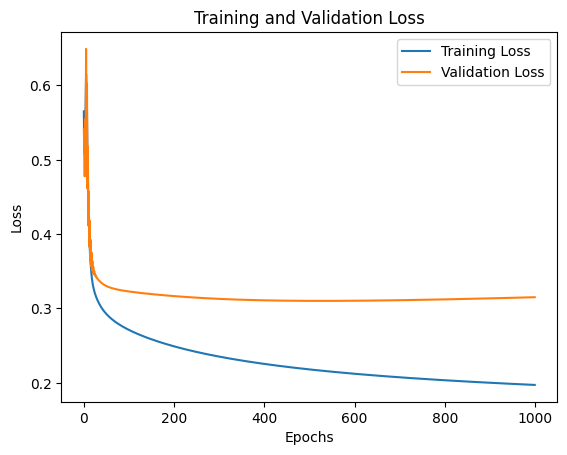

In [74]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

In [75]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [76]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\User\AppData\Local\Temp\ipykernel_3184\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [77]:
y_train.shape

(1711, 1)

In [78]:
y_train.reshape(-1).shape, y_predicted.shape

((1711,), (1711,))

In [79]:
(y_train.reshape(-1) == y_predicted).sum()

1583

In [80]:
y_train = y_train.reshape(-1)

In [81]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

#### Looking at the metrics below, our model was able to make more correct predictions using Polynomial Transformation, resulting higher f1 score both in train and in validation

In [82]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 92.52% 
 Precision: 89.61% 
 Recall: 77.80% 
 F1 Score: 83.29% 
 Specificity: 97.16% 
 False Positive Rate: 2.84% 
 False Negative Rate: 22.20%


In [84]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\User\AppData\Local\Temp\ipykernel_3184\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [85]:
y_validation = y_validation.reshape(-1)

In [86]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [87]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 86.45% 
 Precision: 79.12% 
 Recall: 64.86% 
 F1 Score: 71.29% 
 Specificity: 94.01% 
 False Positive Rate: 5.99% 
 False Negative Rate: 35.14%


In [88]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 86.45% 
 Precision: 79.12% 
 Recall: 64.86% 
 F1 Score: 71.29% 
 Specificity: 94.01% 
 False Positive Rate: 5.99% 
 False Negative Rate: 35.14%


### Analyze the feature importance

<Axes: ylabel='Feature'>

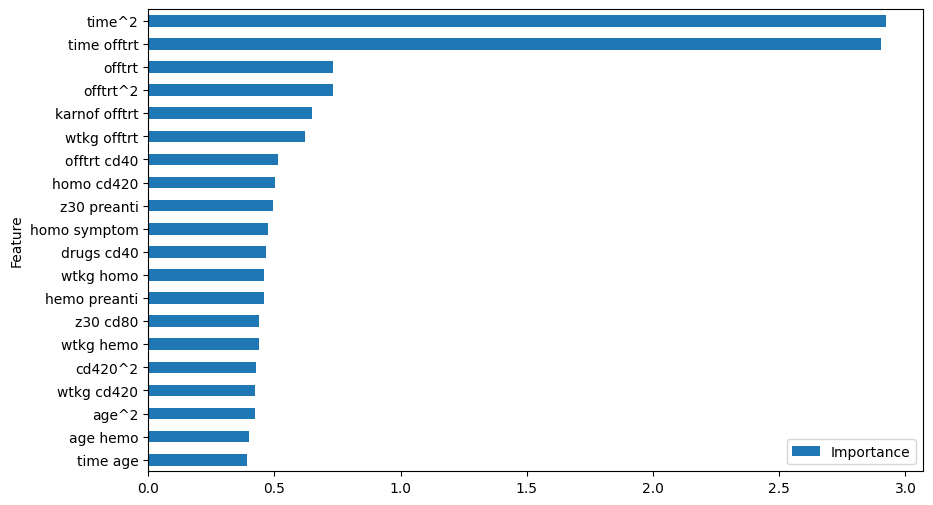

In [89]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.tail(20).plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

#### For example most important feature is obtained by multipling two features: Total day minutes and Customer service calls

### Regularization: 
#### To adjust the overfitting from the previous polynomial model we apply Ridge L2 Regularization

In [90]:
def compute_cost_reg(X, y, w, b, lambda_ = 1):
    m, n = X.shape
    
    # Calls the compute_cost function that you implemented above
    cost_without_reg = compute_cost(X, y, w, b) 
    
    # You need to calculate this value
    reg_cost = 0.
    
    for j in range(n):
      reg_cost += w[j]**2 # Your code here to calculate the cost from w[j]
    
    # Add the regularization cost to get the total cost
    total_cost = cost_without_reg + (lambda_ / (2 * m)) * reg_cost

    return total_cost

In [91]:
def compute_gradient_reg(x_train, y_train, w, b, lambda_=1):
    m, n = x_train.shape
    
    dj_db, dj_dw = compute_gradient(x_train, y_train, w, b)
    
    for j in range(n):
        # Add the regularization term  to the correspoding element of dj_dw
        dj_dw[j] += (lambda_ / m) * w[j] # Your code here to calculate the regularization term for dj_dw[j]
        
    return dj_db, dj_dw

In [92]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_reg_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_reg_poly_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_reg_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_reg_poly_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [93]:
np.random.seed(1)
initial_w = np.random.rand(len(x_train[0]))
initial_b = np.random.rand(1)

initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.3
lambda_ = 7

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost_reg, gradient_function=compute_gradient_reg, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: 0.565313 	  Cost Validation: 0.541278
Iteration  100: Cost Train: 0.277157 	  Cost Validation: 0.323566
Iteration  200: Cost Train: 0.261726 	  Cost Validation: 0.317945
Iteration  300: Cost Train: 0.254377 	  Cost Validation: 0.314432
Iteration  400: Cost Train: 0.250400 	  Cost Validation: 0.312226
Iteration  500: Cost Train: 0.248120 	  Cost Validation: 0.310853
Iteration  600: Cost Train: 0.246761 	  Cost Validation: 0.309998
Iteration  700: Cost Train: 0.245926 	  Cost Validation: 0.309464
Iteration  800: Cost Train: 0.245401 	  Cost Validation: 0.309131
Iteration  900: Cost Train: 0.245064 	  Cost Validation: 0.308927
Iteration  999: Cost Train: 0.244846 	  Cost Validation: 0.308805


#### With regularization applied to the slope(w) and a smaller learning rate(alpha=0.3) we can see that the loss keeps decreasing in both train and validation

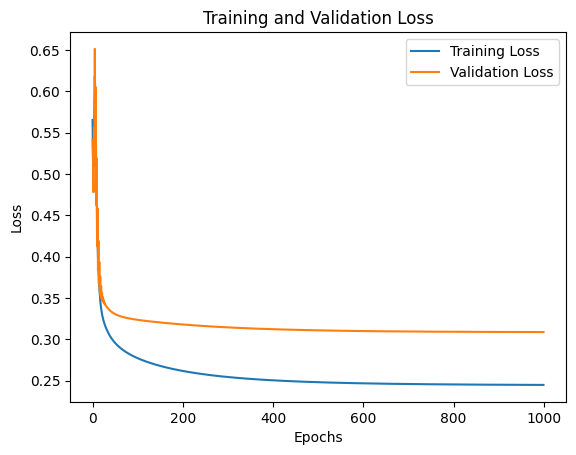

In [94]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

In [95]:
best_reg_poly_w_final = np.load('model/best_reg_poly_valid_w_in.npy')
best_reg_poly_b_final = np.load('model/best_reg_poly_valid_b.npy')

In [96]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [97]:
y_predicted = predict(x_train, w_final, b_final)

In [98]:
y_train.shape

(1711,)

In [99]:
y_train.reshape(-1).shape, y_predicted.shape

((1711,), (1711,))

In [100]:
(y_train.reshape(-1) == y_predicted).sum()

1568

In [101]:
y_train = y_train.reshape(-1)

In [102]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [103]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 91.64% 
 Precision: 88.25% 
 Recall: 75.12% 
 F1 Score: 81.16% 
 Specificity: 96.85% 
 False Positive Rate: 3.15% 
 False Negative Rate: 24.88%


In [104]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 91.64% 
 Precision: 88.25% 
 Recall: 75.12% 
 F1 Score: 81.16% 
 Specificity: 96.85% 
 False Positive Rate: 3.15% 
 False Negative Rate: 24.88%


In [105]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [106]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [107]:
y_validation = y_validation.reshape(-1)

In [108]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [109]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 87.15% 
 Precision: 81.82% 
 Recall: 64.86% 
 F1 Score: 72.36% 
 Specificity: 94.95% 
 False Positive Rate: 5.05% 
 False Negative Rate: 35.14%


### Decision Tree 
#### Specialized in learning non-linear data
#### No need for Normalization/Standardization
#### No need for Polynomial Feature Transformation

In [111]:
x_data = data.drop(columns=['infected'])

### Split data into training and validation datasets: Default 80% train, 20% validation

In [112]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [113]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [114]:
x_train[0]

array([948.    ,   2.    ,  48.    ,  89.8128,   0.    ,   0.    ,
         0.    , 100.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   1.    ,   0.    ,   1.    ,   0.    ,
       422.    , 477.    , 566.    , 324.    ])

### Visualize the nuber of training samples and number of validation samples

In [115]:
len(y_train), len(y_validation)

(1711, 428)

### Visualize the number of NOT INFECTED vs INFECTED samples in training dataset

#### Having 75.6% samples with NOT INFECTED and 24.4% samples with INFECTED in our dataset
#### So we have a ratio of 3 NOT INFECTED samples to 1 INFECTED sample
#### Our training and validation dataset should respect this ratio approximately

In [117]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int64), array([1301,  410], dtype=int64))

#### 1301 samples of 0 (NOT INFECTED) and 410 samples of 1 (INFECTED)
#### 410 * 3 = 1230

### Visualize the number of NOT INFECTED vs INFECTED samples in validation dataset

#### 317 samples of 0 (NOT INFECTED) and 111 samples of 1 (INFECTED)
#### 111 * 3 = 333

In [118]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int64), array([317, 111], dtype=int64))

### Decision Tree Code and Implementation

In [119]:
class Node():
    def __init__(self, feature_index=None, threshold=None, left=None, right=None, info_gain=None, value=None):
        ''' constructor ''' 
        
        # for decision node
        self.feature_index = feature_index
        self.threshold = threshold
        self.left = left
        self.right = right
        self.info_gain = info_gain
        
        # for leaf node
        self.value = value

In [120]:

class DecisionTreeClassifier():
    def __init__(self, min_samples_split=2, max_depth=2):
        ''' constructor '''
        
        # initialize the root of the tree 
        self.root = None
        
        # stopping conditions
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        
    def build_tree(self, dataset, curr_depth=0):
        ''' recursive function to build the tree ''' 
        
        X, Y = dataset[:,:-1], dataset[:,-1]
        num_samples, num_features = np.shape(X)
        
        # split until stopping conditions are met
        if num_samples>=self.min_samples_split and curr_depth<=self.max_depth:
            # find the best split
            best_split = self.get_best_split(dataset, num_samples, num_features)
            # check if information gain is positive
            if best_split["info_gain"]>0:
                # recur left
                left_subtree = self.build_tree(best_split["dataset_left"], curr_depth+1)
                # recur right
                right_subtree = self.build_tree(best_split["dataset_right"], curr_depth+1)
                # return decision node
                return Node(best_split["feature_index"], best_split["threshold"], 
                            left_subtree, right_subtree, best_split["info_gain"])
        
        # compute leaf node
        leaf_value = self.calculate_leaf_value(Y)
        # return leaf node
        return Node(value=leaf_value)
    
    def get_best_split(self, dataset, num_samples, num_features):
        ''' function to find the best split '''
        
        # dictionary to store the best split
        best_split = {}
        max_info_gain = -float("inf")
        
        # loop over all the features
        for feature_index in range(num_features):
            feature_values = dataset[:, feature_index]
            possible_thresholds = np.unique(feature_values)
            # loop over all the feature values present in the data
            for threshold in possible_thresholds:
                # get current split
                dataset_left, dataset_right = self.split(dataset, feature_index, threshold)
                # check if childs are not null
                if len(dataset_left)>0 and len(dataset_right)>0:
                    y, left_y, right_y = dataset[:, -1], dataset_left[:, -1], dataset_right[:, -1]
                    # compute information gain
                    curr_info_gain = self.information_gain(y, left_y, right_y, "entropy")
                    # update the best split if needed
                    if curr_info_gain>max_info_gain:
                        best_split["feature_index"] = feature_index
                        best_split["threshold"] = threshold
                        best_split["dataset_left"] = dataset_left
                        best_split["dataset_right"] = dataset_right
                        best_split["info_gain"] = curr_info_gain
                        max_info_gain = curr_info_gain
                        
        # return best split
        return best_split
    
    def split(self, dataset, feature_index, threshold):
        ''' function to split the data '''
        
        dataset_left = np.array([row for row in dataset if row[feature_index]<=threshold])
        dataset_right = np.array([row for row in dataset if row[feature_index]>threshold])
        return dataset_left, dataset_right
    
    def information_gain(self, parent, l_child, r_child, mode="entropy"):
        ''' function to compute information gain '''
        
        weight_l = len(l_child) / len(parent)
        weight_r = len(r_child) / len(parent)
        if mode=="gini":
            gain = self.gini_index(parent) - (weight_l*self.gini_index(l_child) + weight_r*self.gini_index(r_child))
        else:
            gain = self.entropy(parent) - (weight_l*self.entropy(l_child) + weight_r*self.entropy(r_child))
        return gain
    
    def entropy(self, y):
        ''' function to compute entropy '''
        
        class_labels = np.unique(y)
        entropy = 0
        for cls in class_labels:
            p_cls = len(y[y == cls]) / len(y)
            entropy += -p_cls * np.log2(p_cls)
        return entropy
    
    def gini_index(self, y):
        ''' function to compute gini index '''
        
        class_labels = np.unique(y)
        gini = 0
        for cls in class_labels:
            p_cls = len(y[y == cls]) / len(y)
            gini += p_cls**2
        return 1 - gini
        
    def calculate_leaf_value(self, Y):
        ''' function to compute leaf node '''
        
        Y = list(Y)
        return max(Y, key=Y.count)
    
    def print_tree(self, features, tree=None, indent=" "):
        ''' function to print the tree '''
        
        if not tree:
            tree = self.root

        if tree.value is not None:
            print(tree.value)

        else:
            print(features[tree.feature_index], "<=", tree.threshold, "?", tree.info_gain)
            print("%sleft:" % (indent), end="")
            self.print_tree(features, tree.left, indent + indent)
            print("%sright:" % (indent), end="")
            self.print_tree(features, tree.right, indent + indent)
    
    def fit(self, X, Y):
        ''' function to train the tree '''
        
        dataset = np.concatenate((X, Y), axis=1)
        self.root = self.build_tree(dataset)
    
    def predict(self, X):
        ''' function to predict new dataset '''
        
        preditions = [self.make_prediction(x, self.root) for x in X]
        return preditions
    
    def make_prediction(self, x, tree):
        ''' function to predict a single data point '''
        
        if tree.value!=None: return tree.value
        feature_val = x[tree.feature_index]
        if feature_val<=tree.threshold:
            return self.make_prediction(x, tree.left)
        else:
            return self.make_prediction(x, tree.right)

#### Declare Decision Tree with corresponding Hyperparameters

In [121]:
classifier = DecisionTreeClassifier(min_samples_split=2, max_depth=7)

In [122]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [123]:
classifier.fit(x_train, y_train)

#### Predict on the training dataset 

In [124]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [125]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [126]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 94.92% 
 Precision: 90.89% 
 Recall: 87.56% 
 F1 Score: 89.19% 
 Specificity: 97.23% 
 False Positive Rate: 2.77% 
 False Negative Rate: 12.44%


In [127]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 94.92% 
 Precision: 90.89% 
 Recall: 87.56% 
 F1 Score: 89.19% 
 Specificity: 97.23% 
 False Positive Rate: 2.77% 
 False Negative Rate: 12.44%


### Display validation metrics

In [128]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [129]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [130]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 85.28% 
 Precision: 72.64% 
 Recall: 69.37% 
 F1 Score: 70.97% 
 Specificity: 90.85% 
 False Positive Rate: 9.15% 
 False Negative Rate: 30.63%


In [131]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 85.28% 
 Precision: 72.64% 
 Recall: 69.37% 
 F1 Score: 70.97% 
 Specificity: 90.85% 
 False Positive Rate: 9.15% 
 False Negative Rate: 30.63%


### Display Decision Tree and Learned rules by the Tree 

In [132]:
list(x_data.columns)

['time',
 'trt',
 'age',
 'wtkg',
 'hemo',
 'homo',
 'drugs',
 'karnof',
 'oprior',
 'z30',
 'preanti',
 'race',
 'gender',
 'str2',
 'strat',
 'symptom',
 'treat',
 'offtrt',
 'cd40',
 'cd420',
 'cd80',
 'cd820']

In [133]:
classifier.print_tree(features=list(x_data.columns))

time <= 898.0 ? 0.2849525840740368
 left:offtrt <= 0.0 ? 0.15595625629944954
  left:time <= 720.0 ? 0.1517420644952665
    left:1.0
    right:cd420 <= 310.0 ? 0.11421198081890316
        left:cd80 <= 756.0 ? 0.10595373205657016
                left:age <= 38.0 ? 0.21899525866266328
                                left:time <= 876.0 ? 0.46691718668869947
                                                                left:age <= 37.0 ? 0.6500224216483541
                                                                                                                                left:1.0
                                                                                                                                right:0.0
                                                                right:0.0
                                right:1.0
                right:1.0
        right:cd820 <= 570.0 ? 0.15885610133687544
                left:0.0
                right:cd820 <= 1430.0 ? 0.1091703

In [134]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

cf= DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=0)  
cf.fit(x_train, y_train)  

DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=0)

In [135]:
y_predicted = cf.predict(x_train) 

In [136]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [137]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 91.41% 
 Precision: 86.43% 
 Recall: 76.10% 
 F1 Score: 80.93% 
 Specificity: 96.23% 
 False Positive Rate: 3.77% 
 False Negative Rate: 23.90%


In [138]:
y_predicted_valid = cf.predict(x_validation)
accuracy_score(y_validation, y_predicted_valid)

0.8738317757009346

In [139]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [140]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 87.38% 
 Precision: 81.32% 
 Recall: 66.67% 
 F1 Score: 73.27% 
 Specificity: 94.64% 
 False Positive Rate: 5.36% 
 False Negative Rate: 33.33%


In [141]:
from sklearn.tree import plot_tree


In [143]:
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(cf, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

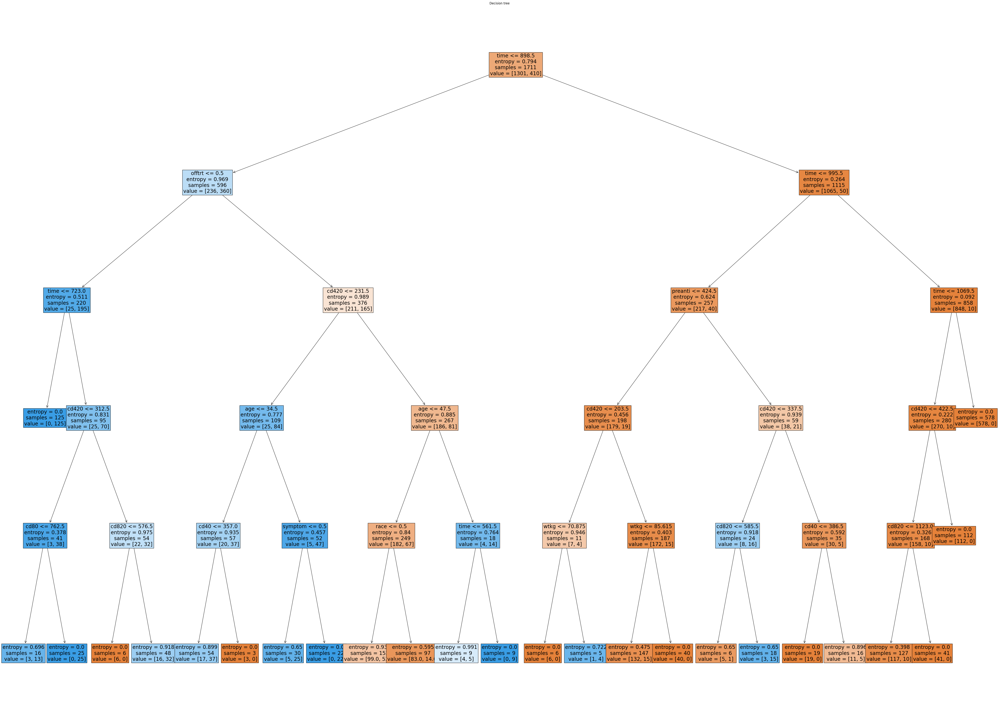

In [144]:
plt.figure(figsize=(70,50))  # set plot size (denoted in inches)
plot_tree(cf, filled=True, fontsize=20, feature_names=list(x_data.columns))
plt.title("Decision tree")
plt.show()

In [145]:
text_representation = export_text(cf, feature_names=list(x_data.columns), class_names=['No Churn', 'Churn'])
print(text_representation)

|--- time <= 898.50
|   |--- offtrt <= 0.50
|   |   |--- time <= 723.00
|   |   |   |--- class: Churn
|   |   |--- time >  723.00
|   |   |   |--- cd420 <= 312.50
|   |   |   |   |--- cd80 <= 762.50
|   |   |   |   |   |--- class: Churn
|   |   |   |   |--- cd80 >  762.50
|   |   |   |   |   |--- class: Churn
|   |   |   |--- cd420 >  312.50
|   |   |   |   |--- cd820 <= 576.50
|   |   |   |   |   |--- class: No Churn
|   |   |   |   |--- cd820 >  576.50
|   |   |   |   |   |--- class: Churn
|   |--- offtrt >  0.50
|   |   |--- cd420 <= 231.50
|   |   |   |--- age <= 34.50
|   |   |   |   |--- cd40 <= 357.00
|   |   |   |   |   |--- class: Churn
|   |   |   |   |--- cd40 >  357.00
|   |   |   |   |   |--- class: No Churn
|   |   |   |--- age >  34.50
|   |   |   |   |--- symptom <= 0.50
|   |   |   |   |   |--- class: Churn
|   |   |   |   |--- symptom >  0.50
|   |   |   |   |   |--- class: Churn
|   |   |--- cd420 >  231.50
|   |   |   |--- age <= 47.50
|   |   |   |   |--- race <= 0